In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from dask.distributed import Client
import s1_rtc_bs_utils
import py3dep
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import math
import shapely
import matplotlib.pyplot as plt
import os
import xarray as xr
from datetime import datetime
import ulmo
from datetime import datetime
import sys

In [2]:
#### CODE FOR DEVELOPMENT-- THIS RELOADS s1_rtc_bs_utils MODULE
#sys.modules.pop('s1_rtc_bs_utils')
#import s1_rtc_bs_utils

In [3]:
# GDAL environment variables for better performance
os.environ['AWS_REGION']='us-west-2'
os.environ['GDAL_DISABLE_READDIR_ON_OPEN']='EMPTY_DIR' 
os.environ['AWS_NO_SIGN_REQUEST']='YES' 
#
xr.set_options(keep_attrs=True)
# Paste /proxy/localhost:8787 for cluster diagnostics
client = Client(local_directory='/tmp', processes=False)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://172.25.45.79:8787/status,
Dashboard: http://172.25.45.79:8787/status,Workers: 1
Total threads: 32,Total memory: 125.71 GiB
Status: running,Using processes: False
Comm: inproc://172.25.45.79/612759/1,Workers: 1
Dashboard: http://172.25.45.79:8787/status,Total threads: 32
Started: Just now,Total memory: 125.71 GiB
Comm: inproc://172.25.45.79/612759/4,Total threads: 32
Dashboard: http://172.25.45.79:44833/status,Memory: 125.71 GiB
Nanny: None,


In [4]:
rainier_bbox_gdf = gpd.read_file('shapefiles/mt_rainier.geojson')

# Test get_s1_rtc_stac()

In [5]:
rainier_sar_ds=s1_rtc_bs_utils.get_s1_rtc_stac(rainier_bbox_gdf,start_time='2015-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),orbit_direction='all',polarization='gamma0_vv',collection='mycollection.json')

In [6]:
%%time
# compute frames, drop missing data
rainier_sar_ds = rainier_sar_ds.compute()
rainier_sar_ds = rainier_sar_ds.dropna('time',how='all')

CPU times: user 17.7 s, sys: 2.23 s, total: 20 s
Wall time: 14.1 s


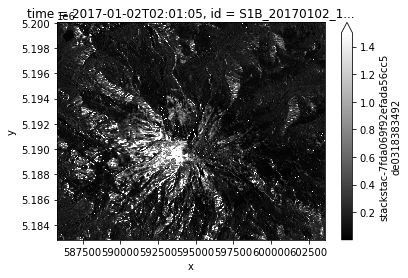

In [7]:
f,ax=plt.subplots()
rainier_sar_ds.isel(time=0).plot(ax=ax,vmax=1.5,cmap='gray')

# Test get_py3dep_dem(), get_py3dep_aspect(), get_py3dep_slope(), get_dah()

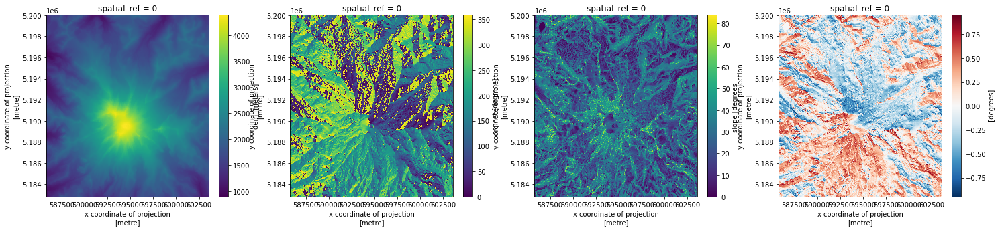

In [8]:
f,ax=plt.subplots(1,4,figsize=(25,5))
s1_rtc_bs_utils.get_py3dep_dem(rainier_sar_ds).plot(ax=ax[0])
s1_rtc_bs_utils.get_py3dep_aspect(rainier_sar_ds).plot(ax=ax[1])
s1_rtc_bs_utils.get_py3dep_slope(rainier_sar_ds).plot(ax=ax[2])
s1_rtc_bs_utils.get_dah(rainier_sar_ds).plot(ax=ax[3])

# Test get_median_ndvi()

In [9]:
dem = s1_rtc_bs_utils.get_py3dep_dem(rainier_sar_ds)
summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(rainier_sar_ds)

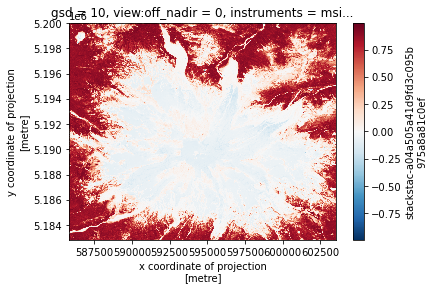

In [10]:
f,ax=plt.subplots()
summer_ndvi_ds.plot(ax=ax)

# Test plot_backscatter_ts_and_ndvi()

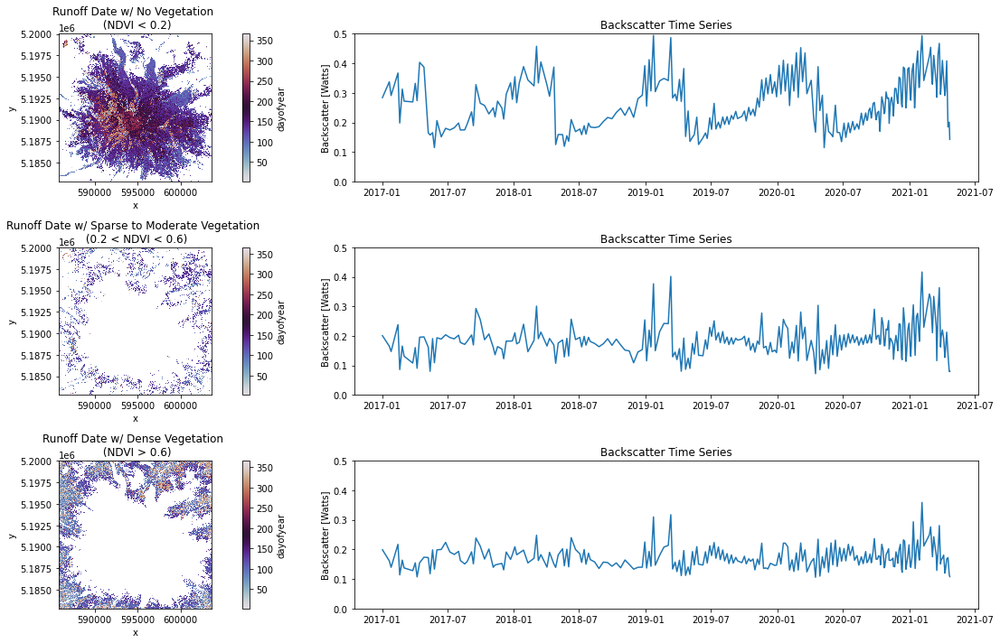

In [11]:
s1_rtc_bs_utils.plot_backscatter_ts_and_ndvi(rainier_sar_ds,summer_ndvi_ds)

# Test get_runoff_onset(), get_ripening_onset()

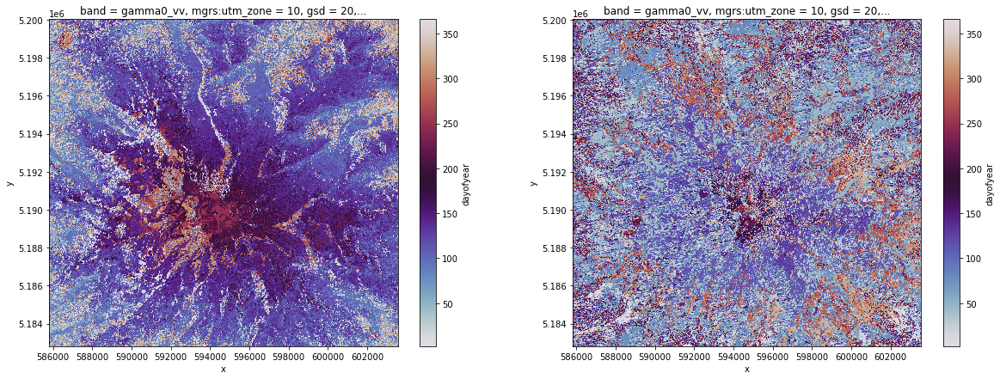

In [12]:
f,ax=plt.subplots(1,2,figsize=(20,7))
s1_rtc_bs_utils.get_runoff_onset(rainier_sar_ds).dt.dayofyear.plot(ax=ax[0],cmap='twilight')
s1_rtc_bs_utils.get_ripening_onset(rainier_sar_ds).dt.dayofyear.plot(ax=ax[1],cmap='twilight')

# Test get_stats()

In [13]:
stats_full_df = s1_rtc_bs_utils.get_stats(rainier_sar_ds)
stats_ndvi_mask_df = s1_rtc_bs_utils.get_stats(rainier_sar_ds.where(summer_ndvi_ds<0.2,drop=True))

rainier_glaciers = gpd.read_file('shapefiles/rainier_glaciers.geojson').to_crs(rainier_sar_ds.crs)
stats_glacier_mask_df = s1_rtc_bs_utils.get_stats(rainier_sar_ds.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False))

In [14]:
stats_full_df.corr()

,elevation,aspect,aspect_rescale,dah,runoff_dates,ripening_dates,runoff_prediction,ripening_prediction
elevation,1.000000,-0.072703,-0.014787,-0.020199,0.229783,0.009604,0.979127,0.093189
aspect,-0.072703,1.000000,-0.017902,0.258516,0.030062,-0.141580,-0.123442,-0.262756
aspect_rescale,-0.014787,-0.017902,1.000000,-0.852216,0.064667,0.042726,0.158831,0.847601
dah,-0.020199,0.258516,-0.852216,1.000000,-0.052331,-0.102781,-0.222987,-0.997328
runoff_dates,0.229783,0.030062,0.064667,-0.052331,1.000000,-0.007997,0.234682,0.068905
ripening_dates,0.009604,-0.141580,0.042726,-0.102781,-0.007997,1.000000,0.030258,0.103057
runoff_prediction,0.979127,-0.123442,0.158831,-0.222987,0.234682,0.030258,1.000000,0.293610
ripening_prediction,0.093189,-0.262756,0.847601,-0.997328,0.068905,0.103057,0.293610,1.000000


In [15]:
stats_ndvi_mask_df.corr()

,elevation,aspect,aspect_rescale,dah,runoff_dates,ripening_dates,runoff_prediction,ripening_prediction
elevation,1.000000,-0.011124,-0.075605,0.042731,0.404050,-0.057073,0.993387,-0.515054
aspect,-0.011124,1.000000,-0.074700,0.308209,0.037392,-0.113482,-0.046524,-0.259103
aspect_rescale,-0.075605,-0.074700,1.000000,-0.850041,0.042952,0.046867,0.022207,0.765454
dah,0.042731,0.308209,-0.850041,1.000000,-0.029390,-0.097333,-0.072258,-0.878383
runoff_dates,0.404050,0.037392,0.042952,-0.029390,1.000000,-0.047227,0.406740,-0.168080
ripening_dates,-0.057073,-0.113482,0.046867,-0.097333,-0.047227,1.000000,-0.045790,0.110809
runoff_prediction,0.993387,-0.046524,0.022207,-0.072258,0.406740,-0.045790,1.000000,-0.413237
ripening_prediction,-0.515054,-0.259103,0.765454,-0.878383,-0.168080,0.110809,-0.413237,1.000000


In [16]:
stats_glacier_mask_df.corr()

,elevation,aspect,aspect_rescale,dah,runoff_dates,ripening_dates,runoff_prediction,ripening_prediction
elevation,1.000000,-0.045860,-0.119764,0.041737,0.463519,-0.021461,0.998900,-0.292344
aspect,-0.045860,1.000000,-0.111255,0.355929,0.032131,-0.063354,-0.062606,-0.329102
aspect_rescale,-0.119764,-0.111255,1.000000,-0.849050,-0.000651,0.046685,-0.080013,0.842894
dah,0.041737,0.355929,-0.849050,1.000000,-0.002397,-0.071036,-0.005166,-0.967682
runoff_dates,0.463519,0.032131,-0.000651,-0.002397,1.000000,-0.042296,0.464029,-0.114695
ripening_dates,-0.021461,-0.063354,0.046685,-0.071036,-0.042296,1.000000,-0.018145,0.073409
runoff_prediction,0.998900,-0.062606,-0.080013,-0.005166,0.464029,-0.018145,1.000000,-0.247173
ripening_prediction,-0.292344,-0.329102,0.842894,-0.967682,-0.114695,0.073409,-0.247173,1.000000


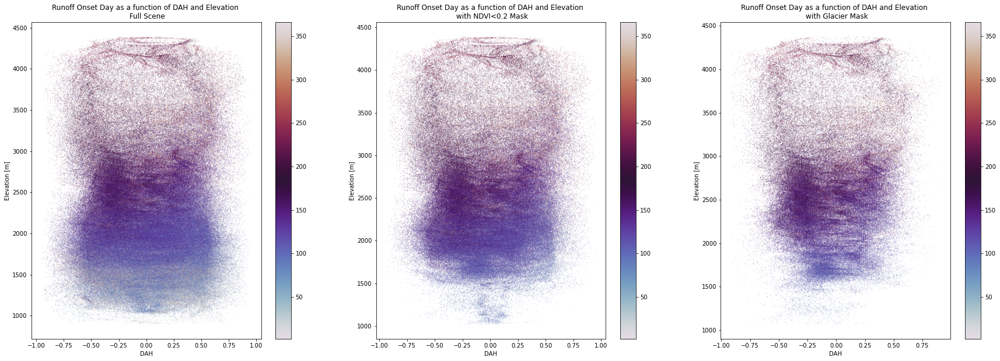

In [17]:
f,ax=plt.subplots(1,3,figsize=(30,10))
color1=ax[0].scatter(stats_full_df['dah'],stats_full_df['elevation'],c=stats_full_df['runoff_dates'],s=0.01,cmap='twilight')
color2=ax[1].scatter(stats_ndvi_mask_df['dah'],stats_ndvi_mask_df['elevation'],c=stats_ndvi_mask_df['runoff_dates'],s=0.01,cmap='twilight')
color3=ax[2].scatter(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],c=stats_glacier_mask_df['runoff_dates'],s=0.01,cmap='twilight')

ax[0].set_title('Runoff Onset Day as a function of DAH and Elevation \n Full Scene')
ax[0].set_xlabel('DAH')
ax[0].set_ylabel('Elevation [m]')

ax[1].set_title('Runoff Onset Day as a function of DAH and Elevation \n with NDVI<0.2 Mask')
ax[1].set_xlabel('DAH')
ax[1].set_ylabel('Elevation [m]')

ax[2].set_title('Runoff Onset Day as a function of DAH and Elevation \n with Glacier Mask')
ax[2].set_xlabel('DAH')
ax[2].set_ylabel('Elevation [m]')

plt.colorbar(color1,ax=ax[0])
plt.colorbar(color2,ax=ax[1])
plt.colorbar(color3,ax=ax[2])

Text(0, 0.5, 'Elevation')

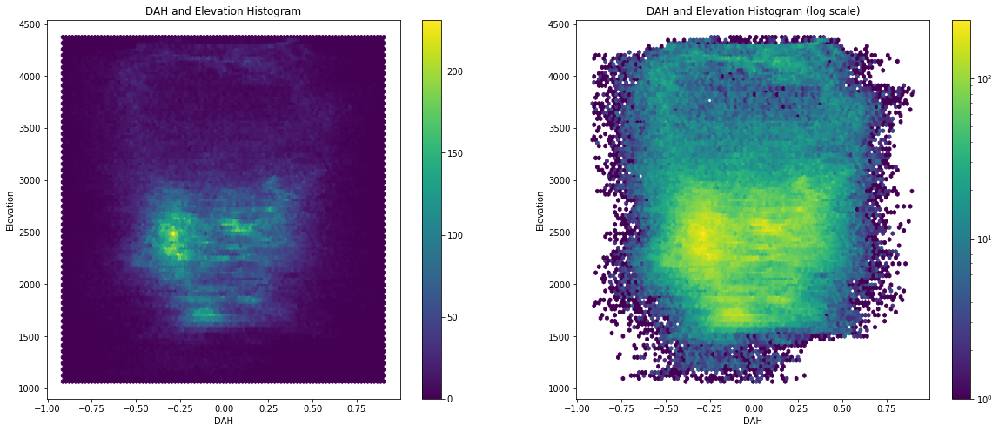

In [69]:
f,ax = plt.subplots(1,2,figsize=(20,8))
color0 = ax[0].hexbin(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'])
f.colorbar(color0,ax=ax[0])
ax[0].set_title('DAH and Elevation Histogram')
ax[0].set_xlabel('DAH')
ax[0].set_ylabel('Elevation')
color1 = ax[1].hexbin(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],bins='log')
f.colorbar(color1,ax=ax[1])
ax[1].set_title('DAH and Elevation Histogram (log scale)')
ax[1].set_xlabel('DAH')
ax[1].set_ylabel('Elevation')

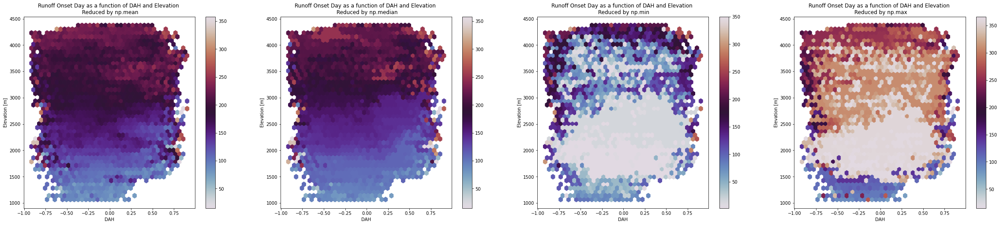

In [71]:
# this plpot is tricky because we need to reduce in some way, but since the values are cylical, most reductions seem invalid
grid_size = 40
f,ax = plt.subplots(1,4,figsize=(40,8))
color0 = ax[0].hexbin(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],C=stats_glacier_mask_df['runoff_dates'],gridsize=grid_size,cmap='twilight',reduce_C_function=np.mean)
ax[0].set_title('Runoff Onset Day as a function of DAH and Elevation \n Reduced by np.mean')
ax[0].set_xlabel('DAH')
ax[0].set_ylabel('Elevation [m]')
f.colorbar(color0,ax=ax[0])

color1 = ax[1].hexbin(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],C=stats_glacier_mask_df['runoff_dates'],gridsize=grid_size,cmap='twilight',reduce_C_function=np.median)
ax[1].set_title('Runoff Onset Day as a function of DAH and Elevation \n Reduced by np.median')
ax[1].set_xlabel('DAH')
ax[1].set_ylabel('Elevation [m]')
f.colorbar(color1,ax=ax[1])

color2 = ax[2].hexbin(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],C=stats_glacier_mask_df['runoff_dates'],gridsize=grid_size,cmap='twilight',reduce_C_function=np.min)
ax[2].set_title('Runoff Onset Day as a function of DAH and Elevation \n Reduced by np.min')
ax[2].set_xlabel('DAH')
ax[2].set_ylabel('Elevation [m]')
f.colorbar(color2,ax=ax[2])

color3 = ax[3].hexbin(stats_glacier_mask_df['dah'],stats_glacier_mask_df['elevation'],C=stats_glacier_mask_df['runoff_dates'],gridsize=grid_size,cmap='twilight',reduce_C_function=np.max)
ax[3].set_title('Runoff Onset Day as a function of DAH and Elevation \n Reduced by np.max')
ax[3].set_xlabel('DAH')
ax[3].set_ylabel('Elevation [m]')
f.colorbar(color3,ax=ax[3])

Text(0.5, 1.0, 'MLS Predicted DOY Ripening Date')

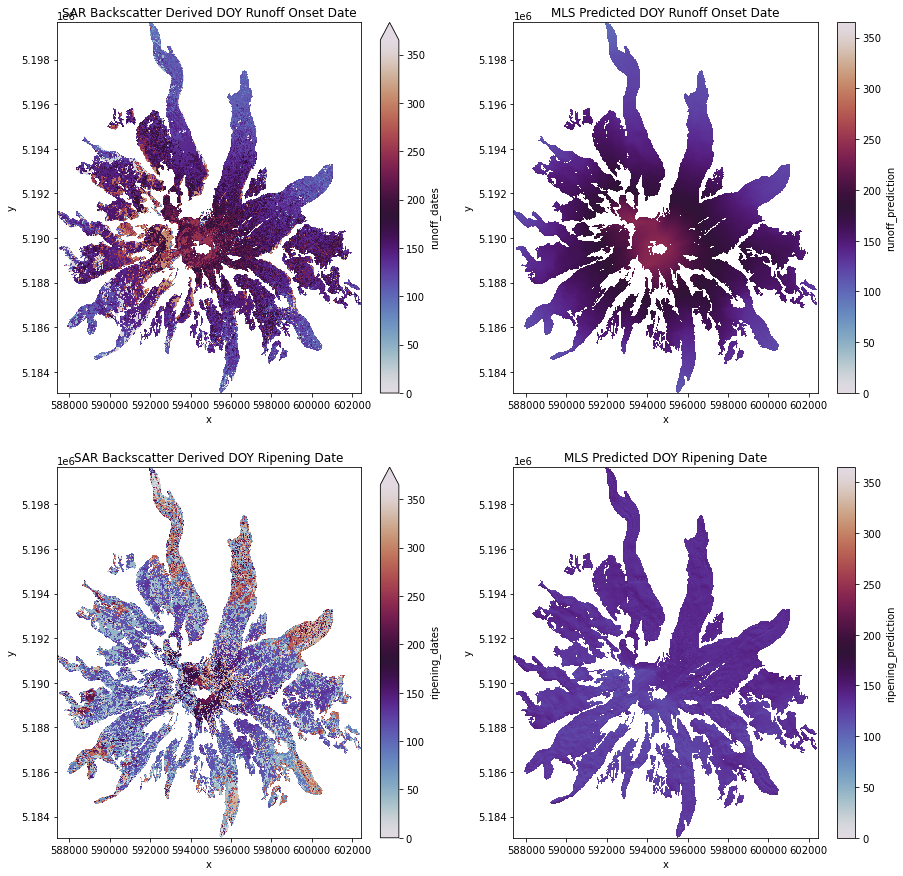

In [18]:
f,ax=plt.subplots(2,2,figsize=(15,15))
stats_glacier_mask_ds = stats_glacier_mask_df.to_xarray() 
stats_glacier_mask_ds['runoff_prediction'].plot(cmap='twilight',ax=ax[0,1],vmin=0,vmax=365)
stats_glacier_mask_ds['runoff_dates'].plot(cmap='twilight',ax=ax[0,0],vmin=0,vmax=365)
ax[0,0].set_title('SAR Backscatter Derived DOY Runoff Onset Date')
ax[0,1].set_title('MLS Predicted DOY Runoff Onset Date')
stats_glacier_mask_ds['ripening_prediction'].plot(cmap='twilight',ax=ax[1,1],vmin=0,vmax=365)
stats_glacier_mask_ds['ripening_dates'].plot(cmap='twilight',ax=ax[1,0],vmin=0,vmax=365)
ax[1,0].set_title('SAR Backscatter Derived DOY Ripening Date')
ax[1,1].set_title('MLS Predicted DOY Ripening Date')

# Test plot_timeseries_by_elevation_bin(), plot_hyposometry()

In [19]:
resample_freq_s1='2W'
rainier_sar_2w_ds = rainier_sar_ds.where(summer_ndvi_ds.values<0.2).resample(time='2W').mean(dim='time')

Text(0.5, 0.98, 'Mt. Rainier Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: backscatter means for a given 100m elevation bin \n top 2 rows are all data, bottom 2 rows are 2 week resampled means')

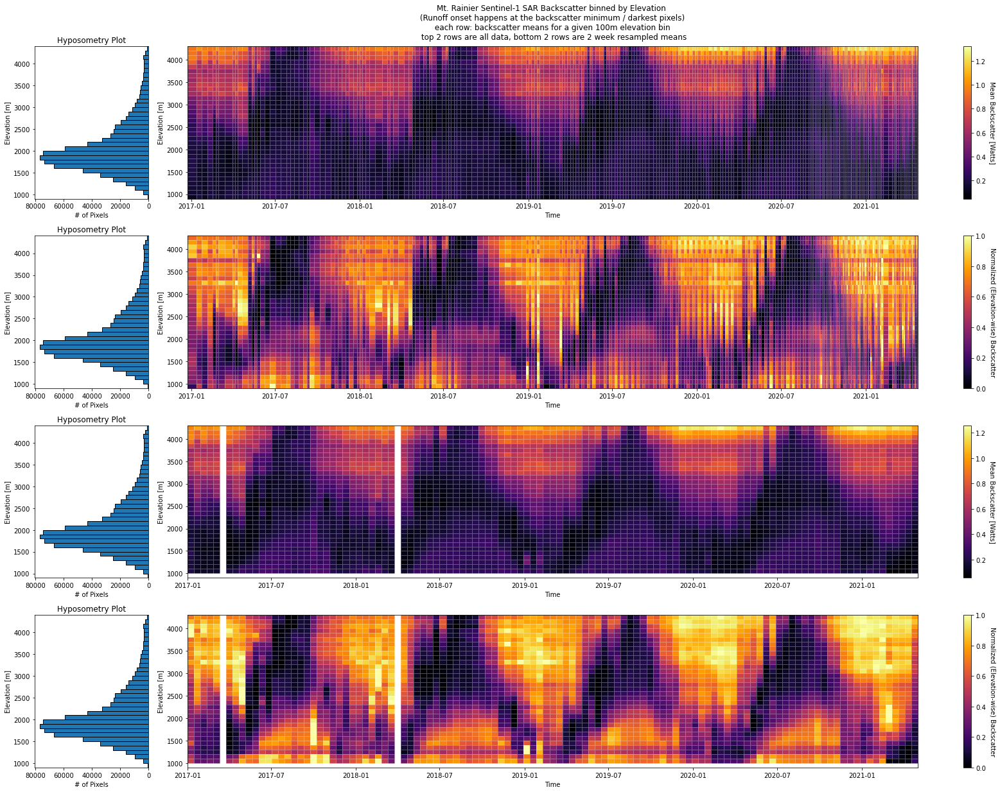

In [20]:
f,ax=plt.subplots(4,2,figsize=(24,18),gridspec_kw={'width_ratios': [1, 8]})
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(rainier_sar_ds,dem,bin_size=100,ax=ax[0,1],normalize_bins=False)
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(rainier_sar_ds,dem,bin_size=100,ax=ax[1,1],normalize_bins=True)
s1_rtc_bs_utils.plot_hyposometry(rainier_sar_ds,dem,bin_size=100,ax=ax[0,0])
s1_rtc_bs_utils.plot_hyposometry(rainier_sar_ds,dem,bin_size=100,ax=ax[1,0])
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(rainier_sar_2w_ds,dem,bin_size=100,ax=ax[2,1],normalize_bins=False)
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(rainier_sar_2w_ds,dem,bin_size=100,ax=ax[3,1],normalize_bins=True)
s1_rtc_bs_utils.plot_hyposometry(rainier_sar_2w_ds,dem,bin_size=100,ax=ax[2,0])
s1_rtc_bs_utils.plot_hyposometry(rainier_sar_2w_ds,dem,bin_size=100,ax=ax[3,0])
ax[0,0].invert_xaxis()
ax[1,0].invert_xaxis()
ax[2,0].invert_xaxis()
ax[3,0].invert_xaxis()
#plt.tight_layout()
f.tight_layout(rect=[0, 0.03, 1, 0.95])
f.suptitle("Mt. Rainier Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: backscatter means for a given 100m elevation bin \n top 2 rows are all data, bottom 2 rows are 2 week resampled means")

# Test plot_timeseries_by_dah_bin(), plot_dah_bins()

In [21]:
dah = s1_rtc_bs_utils.get_dah(rainier_sar_ds)

Text(0.5, 0.98, 'Mt. Rainier Sentinel-1 SAR Backscatter binned by DAH \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each column: backscatter for a given 0.25 DAH bin \n (DAH = 1 has greatest insolation, DAH = -1 has the least insolation)')

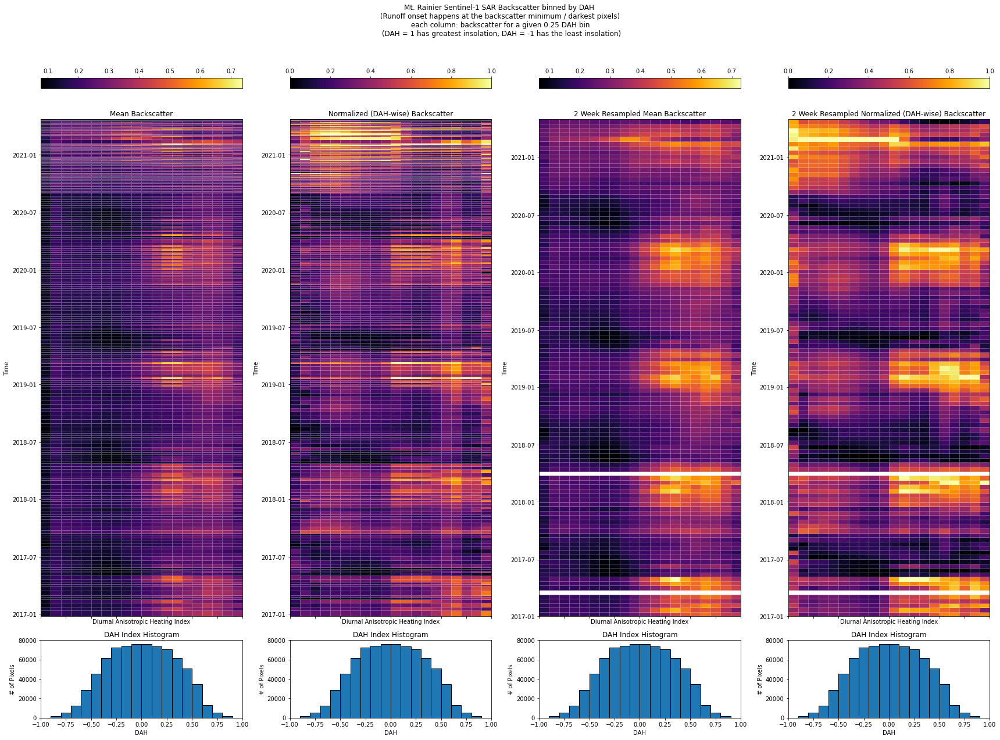

In [22]:
bin_size = 0.1
f,ax=plt.subplots(2,4,figsize=(24,18),sharex=True,gridspec_kw={'height_ratios': [8, 1]})
s1_rtc_bs_utils.plot_timeseries_by_dah_bin(rainier_sar_ds,dah,bin_size=bin_size,ax=ax[0,0],normalize_bins=False)
s1_rtc_bs_utils.plot_timeseries_by_dah_bin(rainier_sar_ds,dah,bin_size=bin_size,ax=ax[0,1],normalize_bins=True)
s1_rtc_bs_utils.plot_timeseries_by_dah_bin(rainier_sar_2w_ds,dah,bin_size=bin_size,ax=ax[0,2],normalize_bins=False)
s1_rtc_bs_utils.plot_timeseries_by_dah_bin(rainier_sar_2w_ds,dah,bin_size=bin_size,ax=ax[0,3],normalize_bins=True)

s1_rtc_bs_utils.plot_dah_bins(rainier_sar_ds,dah,bin_size=bin_size,ax=ax[1,0])
s1_rtc_bs_utils.plot_dah_bins(rainier_sar_ds,dah,bin_size=bin_size,ax=ax[1,1])
s1_rtc_bs_utils.plot_dah_bins(rainier_sar_2w_ds,dah,bin_size=bin_size,ax=ax[1,2])
s1_rtc_bs_utils.plot_dah_bins(rainier_sar_2w_ds,dah,bin_size=bin_size,ax=ax[1,3])

ax[0,0].set_title('Mean Backscatter')
ax[0,1].set_title('Normalized (DAH-wise) Backscatter')
ax[0,2].set_title('2 Week Resampled Mean Backscatter')
ax[0,3].set_title('2 Week Resampled Normalized (DAH-wise) Backscatter')
#plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.tight_layout()
f.suptitle("Mt. Rainier Sentinel-1 SAR Backscatter binned by DAH \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each column: backscatter for a given 0.25 DAH bin \n (DAH = 1 has greatest insolation, DAH = -1 has the least insolation)")

# Test find_closest_snotel()

In [23]:
s1_rtc_bs_utils.find_closest_snotel(rainier_sar_ds)

,code,name,elevation_m,geometry,distance_km
SNOTEL:679_WA_SNTL,679_WA_SNTL,Paradise,1563.624023,POINT (595595.572 5181772.683),1.037317
SNOTEL:941_WA_SNTL,941_WA_SNTL,Mowich,963.168030,POINT (579756.913 5197732.382),6.033087
SNOTEL:1085_WA_SNTL,1085_WA_SNTL,Cayuse Pass,1597.151978,POINT (611700.715 5191709.650),8.130715
SNOTEL:942_WA_SNTL,942_WA_SNTL,Burnt Mountain,1271.015991,POINT (580495.481 5210642.884),11.860238
SNOTEL:642_WA_SNTL,642_WA_SNTL,Morse Lake,1648.968018,POINT (615555.470 5195819.019),11.985470
...,...,...,...,...,...
SNOTEL:1177_AK_SNTL,1177_AK_SNTL,Prudhoe Bay,9.144000,POINT (-438458.080 7996787.513),2978.411777
SNOTEL:986_AK_SNTL,986_AK_SNTL,Pargon Creek,30.480000,POINT (-1285933.578 7807093.295),3209.381277
SNOTEL:973_AK_SNTL,973_AK_SNTL,Rocky Point,76.199997,POINT (-1330776.287 7774460.473),3209.504415
SNOTEL:1036_AK_SNTL,1036_AK_SNTL,Johnsons Camp,7.620000,POINT (-1362951.239 7803978.992),3252.405689


# Test plot_closest_snotel()

<AxesSubplot:title={'center':'SNOTEL Sites Around Study Site'}, xlabel='x', ylabel='y'>

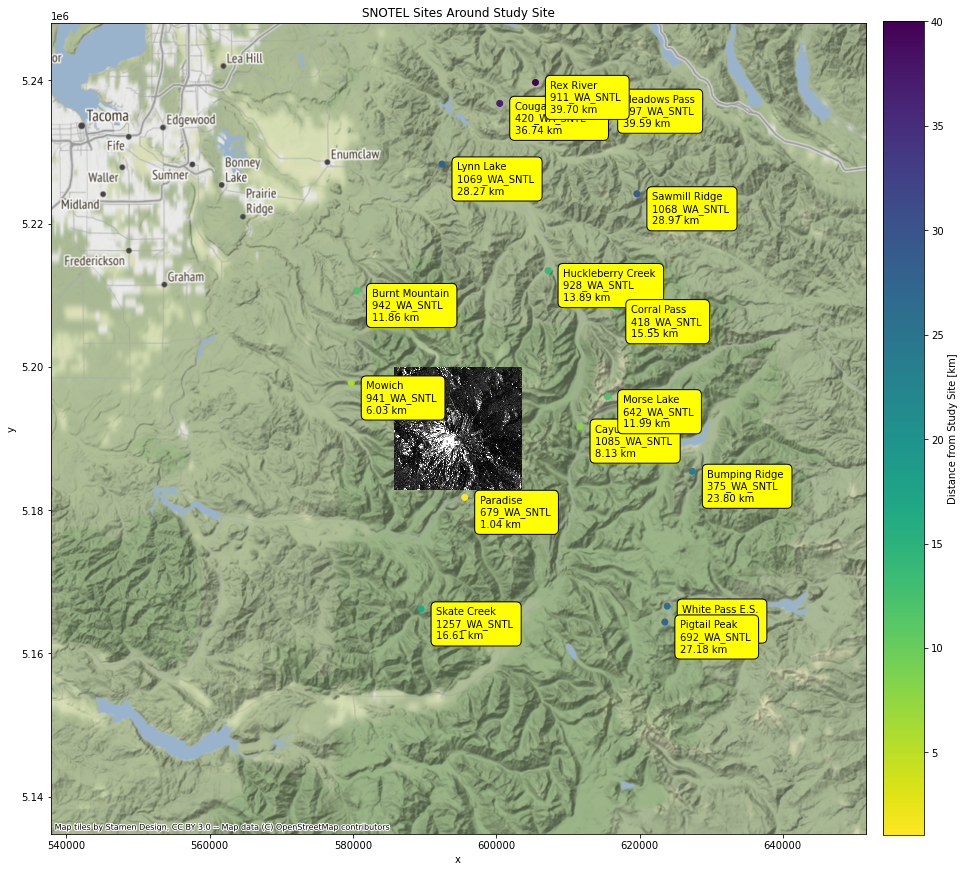

In [24]:
f, ax = plt.subplots(figsize=(15,15))
s1_rtc_bs_utils.plot_closest_snotel(rainier_sar_ds,distance_cutoff=40,ax=ax)

# Test get_snotel()

In [25]:
sitecode = 'SNOTEL:679_WA_SNTL'
#variablecode = 'SNOTEL:TAVG_D'
#variablecode = 'SNOTEL:PRCPSA_D'
#variablecode = 'SNOTEL:WTEQ_D'
values_df = s1_rtc_bs_utils.get_snotel(sitecode, variable_code='SNOTEL:SNWD_D',start_date='1900-01-01', end_date=datetime.today().strftime('%Y-%m-%d'))
values_df['value'] = 2.54*values_df['value'] #inches to cm
values_df

,value,qualifiers,censor_code,date_time_utc,method_id,method_code,source_code,quality_control_level_code
datetime,,,,,,,,
2006-08-18 00:00:00+00:00,0.00,E,nc,2006-08-18T00:00:00,0,0,1,1
2006-08-19 00:00:00+00:00,0.00,E,nc,2006-08-19T00:00:00,0,0,1,1
2006-08-20 00:00:00+00:00,0.00,E,nc,2006-08-20T00:00:00,0,0,1,1
2006-08-21 00:00:00+00:00,0.00,E,nc,2006-08-21T00:00:00,0,0,1,1
2006-08-22 00:00:00+00:00,0.00,E,nc,2006-08-22T00:00:00,0,0,1,1
...,...,...,...,...,...,...,...,...
2022-04-21 00:00:00+00:00,403.86,V,nc,2022-04-21T00:00:00,0,0,1,1
2022-04-22 00:00:00+00:00,396.24,V,nc,2022-04-22T00:00:00,0,0,1,1
2022-04-23 00:00:00+00:00,396.24,V,nc,2022-04-23T00:00:00,0,0,1,1


# Test get_closest_snotel_data()

In [26]:
snotel_data = s1_rtc_bs_utils.get_closest_snotel_data(rainier_sar_ds,variable_code='SNOTEL:SNWD_D',distance_cutoff=30,start_date='1900-01-01', end_date=datetime.today().strftime('%Y-%m-%d'))

Text(0.5, 1.0, 'Snow Depth for SNOTEL Stations Close in Proximety to Dataset')

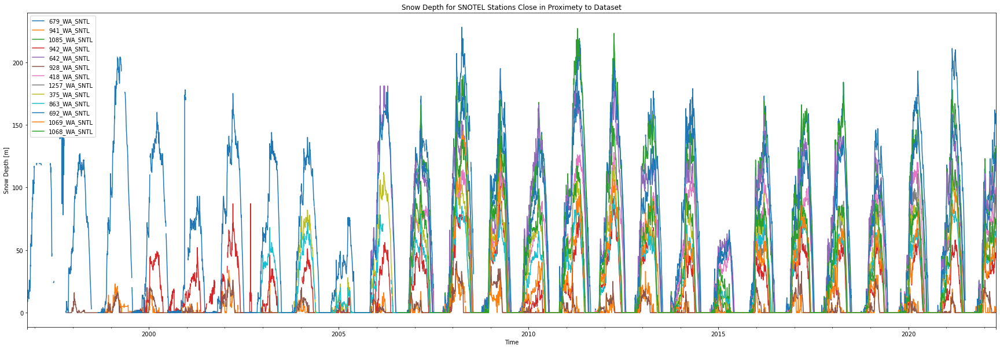

In [27]:
f, ax = plt.subplots(figsize=(30,10))
snotel_data.plot(ax=ax)
ax.set_xlabel('Time')
ax.set_ylabel('Snow Depth [m]')
ax.set_title('Snow Depth for SNOTEL Stations Close in Proximety to Dataset')

In [28]:
# TODO .get_s2optical() .aggregate_by_time() .plot_gif() .plot_runoff() .plot_ripening() .plot_bs_snotel_ndsi()